In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install facenet-pytorch

In [ ]:
!pip install retina-face

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow
import tensorflow as tf
import keras
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten,Dense,Dropout,BatchNormalization
from keras import regularizers
from keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from retinaface import RetinaFace

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# 모델 생성

In [ ]:
from facenet_pytorch import InceptionResnetV1

def make_age_model():
    model = InceptionResnetV1(classify=True, pretrained='vggface2', num_classes=1)
    in_dim = model.logits.in_features
    model.logits = nn.Linear(in_dim, 1)
    return model

def load_model(model, path):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    checkpoint = torch.load(path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    return model

age = make_age_model()

age_model_path = '/content/drive/MyDrive/models/age_model_checkpoint_epoch_10_loss_4.57.pth'
age_model = load_model(age, age_model_path)

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [ ]:
class Gender_Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3)
        self.bn5 = nn.BatchNorm2d(512)

        self.pool = nn.MaxPool2d(kernel_size=3, stride=2)

        self.fc1 = nn.Linear(512 * 4 * 4, 512)
        self.dropout = nn.Dropout(0.25)
        self.fc2 = nn.Linear(512, 1)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        x = self.pool(F.relu(self.bn5(self.conv5(x))))

        x = x.view(-1, 512 * 4 * 4)
        x = F.relu(self.fc1(self.dropout(x)))
        x = self.fc2(x)
        x = x.squeeze()
        return x

gender_model_path = '/content/drive/MyDrive/models/gender_model_v3_checkpoint_epoch_19.pth'
gender = Gender_Net()
gender_model = load_model(gender, gender_model_path)

In [ ]:
emotion_model= tf.keras.models.Sequential()
emotion_model.add(Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape=(48, 48,1)))
emotion_model.add(Conv2D(64,(3,3), padding='same', activation='relu' ))
emotion_model.add(BatchNormalization())
emotion_model.add(MaxPool2D(pool_size=(2, 2)))
emotion_model.add(Dropout(0.25))

emotion_model.add(Conv2D(128,(5,5), padding='same', activation='relu'))
emotion_model.add(BatchNormalization())
emotion_model.add(MaxPool2D(pool_size=(2, 2)))
emotion_model.add(Dropout(0.25))

emotion_model.add(BatchNormalization())
emotion_model.add(MaxPool2D(pool_size=(2, 2)))
emotion_model.add(Dropout(0.25))

emotion_model.add(Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)))
emotion_model.add(BatchNormalization())
emotion_model.add(MaxPool2D(pool_size=(2, 2)))
emotion_model.add(Dropout(0.25))

emotion_model.add(Flatten())
emotion_model.add(Dense(256,activation = 'relu'))
emotion_model.add(BatchNormalization())
emotion_model.add(Dropout(0.25))

emotion_model.add(Dense(512,activation = 'relu'))
emotion_model.add(BatchNormalization())
emotion_model.add(Dropout(0.25))

emotion_model.add(Dense(7, activation='softmax'))

emotion_model.compile(
    optimizer = Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
  )
emotion_model_path = '/content/drive/MyDrive/models/emotion_model_checkpoint_epoch_82_acc_0.68_v1.h5'
emotion_model = load_model(emotion_model_path)

In [ ]:
def process_input(img, box):
    img_ar = img[box[1]:box[3], box[0]:box[2]]
    image = Image.fromarray(img_ar)

    # 모델의 input에 맞게 전처리
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.6284, 0.4901, 0.4325], std=[0.1869, 0.1712, 0.1561]),
    ])
    img_tensor = preprocess(image).unsqueeze(0)  # 배치 차원 추가
    return img_tensor

In [ ]:
def emotion_process_input(img, box):
  img_ar = img[box[1]:box[3], box[0]:box[2]]

  img_gray = cv2.cvtColor(img_ar, cv2.COLOR_BGR2GRAY)
  img_gray = cv2.resize(img_gray, (48, 48))
  image = Image.fromarray(img_gray)
  image = np.expand_dims(image, axis=0)
  img_tensor = image.astype(np.float32) / 255.0
  return img_tensor

In [ ]:
def predict_age(image, model):
    image = image.to(device)
    model = model.to(device)

    model.eval()
    with torch.no_grad():
        prediction = model(image)
        # print(prediction.item())
    return prediction.item()

In [ ]:
def predict_gender(image, model):
    image = image.to(device)
    model = model.to(device)

    model.eval()
    with torch.no_grad():
        logit = model(image)
        pred = torch.sigmoid(logit)
        output = 'Male' if pred.item() < 0.5 else 'Female'
        # print(f'Predicted Gender: {output} (Probability: {pred.item():.10f})')

    return output

In [ ]:
def predict_emotion(image, model):
  label_dict = {0:'Angry', 1:'Fear', 2:'Happy', 3:'Neutral', 4:'Sad', 5:'Surprise'}

  result = emotion_model.predict(image, verbose=0)
  result = list(result[0])
  # print(result)

  img_index = result.index(max(result))
  return label_dict[img_index]

# 이미지 시각화

24-03-07 01:43:24 - Directory /root/.deepface created
24-03-07 01:43:24 - Directory /root/.deepface/weights created
24-03-07 01:43:24 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5
100%|██████████| 119M/119M [00:04<00:00, 29.6MB/s]


[0.03740917, 0.035207074, 0.0077054254, 0.58902335, 0.33010888, 0.00054607843]
Neutral


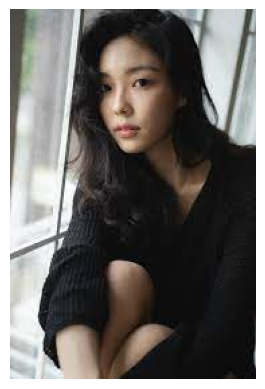

In [ ]:
image_path = '/content/girl.jpg'
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

resp = RetinaFace.detect_faces(img_rgb)
for face in resp.values():
        box = face['facial_area']
        img_tensor = emotion_process_input(img_rgb, box)

print(predict_emotion(img_tensor, emotion_model))

img_original = image.load_img("/content/girl.jpg")
plt.imshow(img_original)
plt.axis('off')
plt.show()

Happy


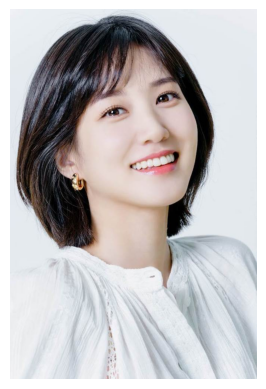

In [ ]:
image_path = '/content/박은빈.png'
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

resp = RetinaFace.detect_faces(img_rgb)
for face in resp.values():
        box = face['facial_area']
        img_tensor = emotion_process_input(img_rgb, box)

print(predict_emotion(img_tensor, emotion_model))

img_original = image.load_img("/content/박은빈.png")
plt.imshow(img_original)
plt.axis('off')
plt.show()

[0.016965393, 0.029151035, 0.0018918937, 0.9001918, 0.050640132, 0.0011597258]
Neutral


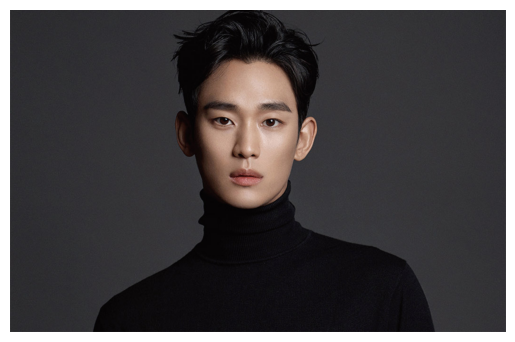

In [ ]:
image_path = '/content/김수현.jpg'
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

resp = RetinaFace.detect_faces(img_rgb)
for face in resp.values():
        box = face['facial_area']
        img_tensor = emotion_process_input(img_rgb, box)

print(predict_emotion(img_tensor, emotion_model))

img_original = image.load_img("/content/김수현.jpg")
plt.imshow(img_original)
plt.axis('off')
plt.show()

In [ ]:
def visualize_predictions(image_path, age_model, gender_model, emotion_model):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    resp = RetinaFace.detect_faces(img_rgb)

    pic = img.copy()
    green_rgb = (125, 255, 51)
    red_rgb = (255, 50, 50)
    blu_rgb = (50, 50, 255)

    for face in resp.values():
        box = face['facial_area']

        img_tensor = process_input(img_rgb, box)
        emotion_img = emotion_process_input(img_rgb, box)

        age = int(predict_age(img_tensor, age_model))
        gender = predict_gender(img_tensor, gender_model)
        emotion = predict_emotion(emotion_img, emotion_model)

        if gender == 'Male':
            color = (255, 0, 0)
        else:
            color = (0, 0, 255)

        cv2.rectangle(pic, (box[0], box[1]), (box[2], box[3]), color=(0, 255, 0), thickness=1)
        if len(resp) > 5:
          cv2.putText(pic, f"Age: {age}", (box[0], box[1]-25), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)
          cv2.putText(pic, f"Gender: {gender}", (box[0], box[1]-15), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)
          cv2.putText(pic, f"Emotion: {emotion}", (box[0], box[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)
        elif len(resp) <= 5 & len(resp) >= 2:
          cv2.putText(pic, f"Age: {age}", (box[0], box[1]-45), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
          cv2.putText(pic, f"Gender: {gender}", (box[0], box[1]-25), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
          cv2.putText(pic, f"Emotion: {emotion}", (box[0], box[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
        else:
          cv2.putText(pic, f"Age: {age}", (box[0], box[1]-55), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)
          cv2.putText(pic, f"Gender: {gender}", (box[0], box[1]-30), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)
          cv2.putText(pic, f"Emotion: {emotion}", (box[0], box[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)

    cv2_imshow(pic)

In [ ]:
def visualize_predictions2(image_path, age_model, gender_model, emotion_model):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    resp = RetinaFace.detect_faces(img_rgb)

    pic = img.copy()
    green_rgb = (125, 255, 51)
    red_rgb = (255, 50, 50)
    blu_rgb = (50, 50, 255)

    for face in resp.values():
        box = face['facial_area']

        img_tensor = process_input(img_rgb, box)
        emotion_img = emotion_process_input(img_rgb, box)

        age = int(predict_age(img_tensor, age_model))
        gender = predict_gender(img_tensor, gender_model)
        emotion = predict_emotion(emotion_img, emotion_model)

        if gender == 'Male':
            color = (255, 0, 0)
        else:
            color = (0, 0, 255)
        text_x = box[0]
        text_y = box[3] + 25
        cv2.rectangle(pic, (box[0], box[1]), (box[2], box[3]), color=(0, 255, 0), thickness=1)
        cv2.putText(pic, f"Age: {age}", (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
        cv2.putText(pic, f"Gender: {gender}", (text_x, text_y + 25), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
        cv2.putText(pic, f"Emotion: {emotion}", (text_x, text_y + 45), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

    cv2_imshow(pic)

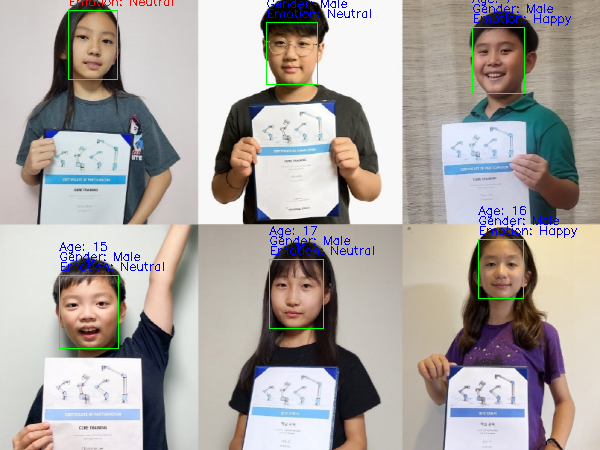

In [ ]:
image_path = '/content/child.png'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

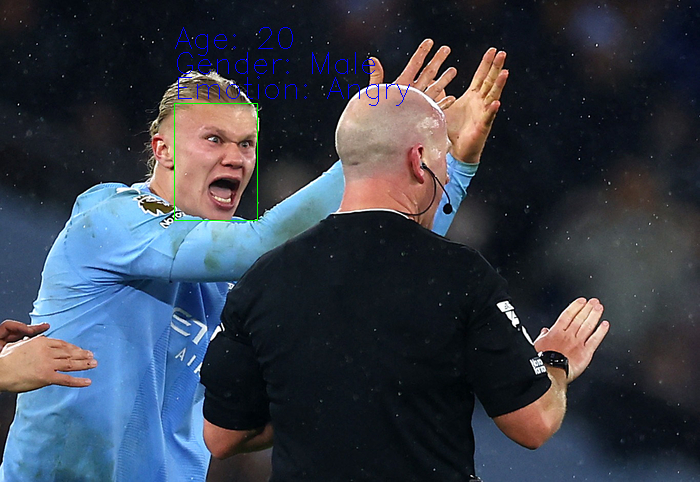

In [ ]:
image_path = '/content/angry.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

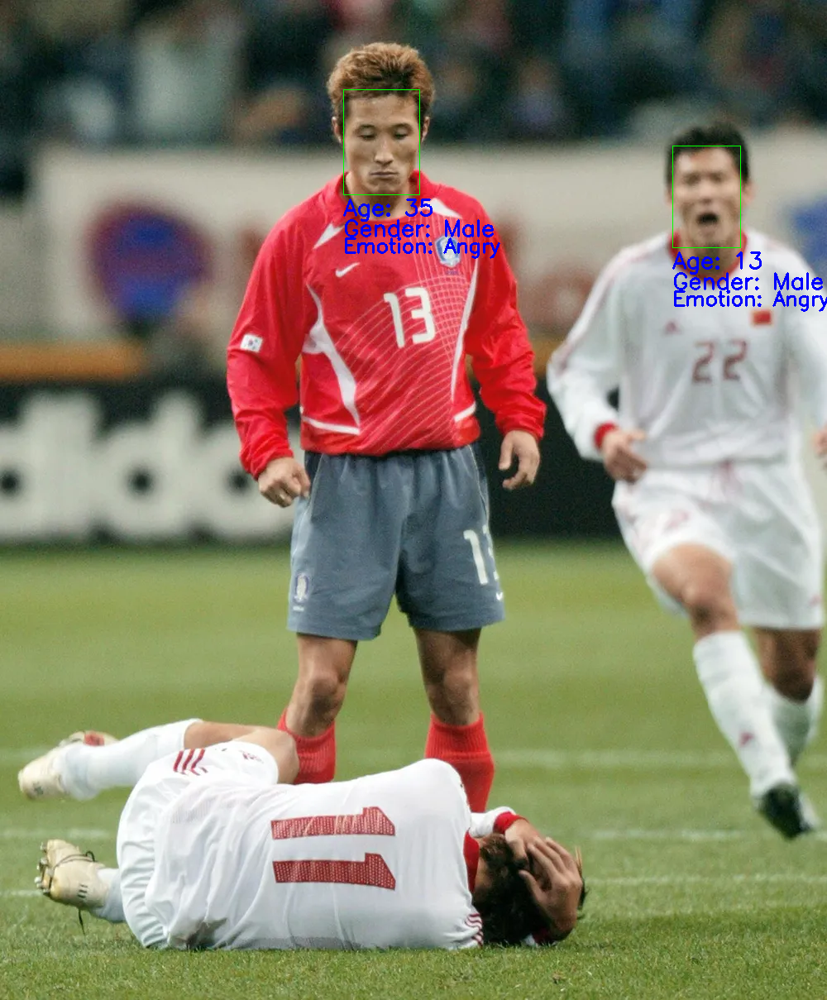

In [ ]:
image_path = '/content/을용타.jpg'
visualize_predictions2(image_path, age_model, gender_model, emotion_model)

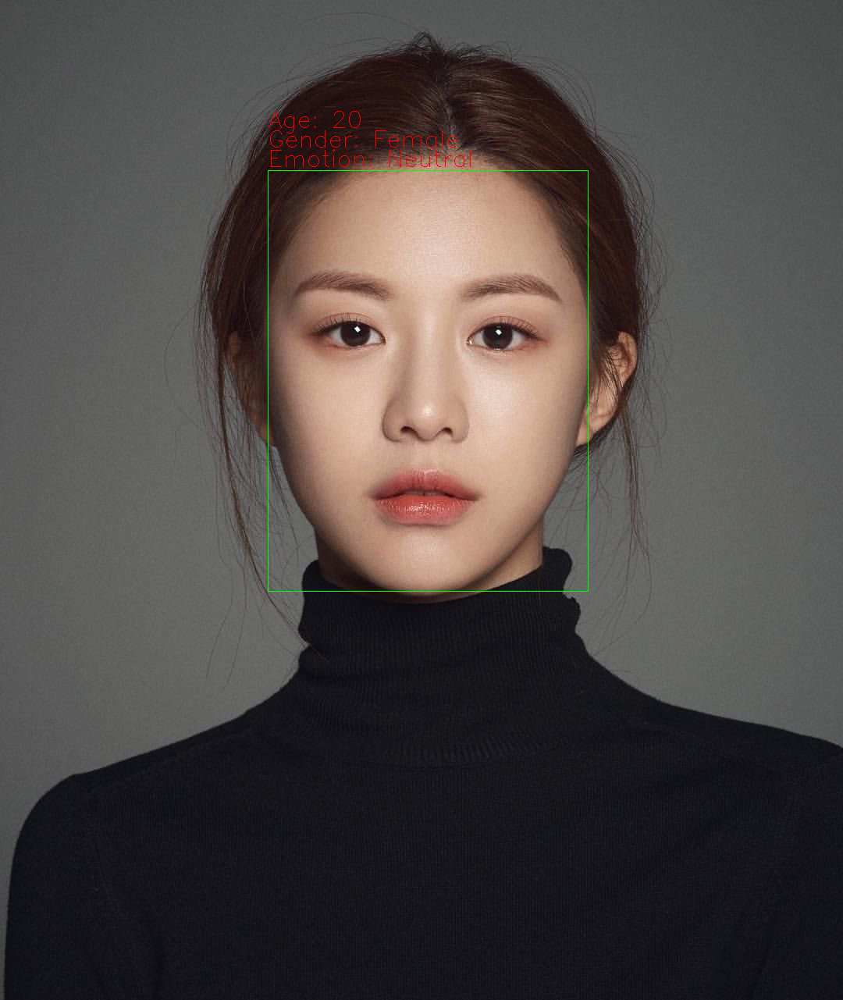

In [ ]:
image_path = '/content/고윤정.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

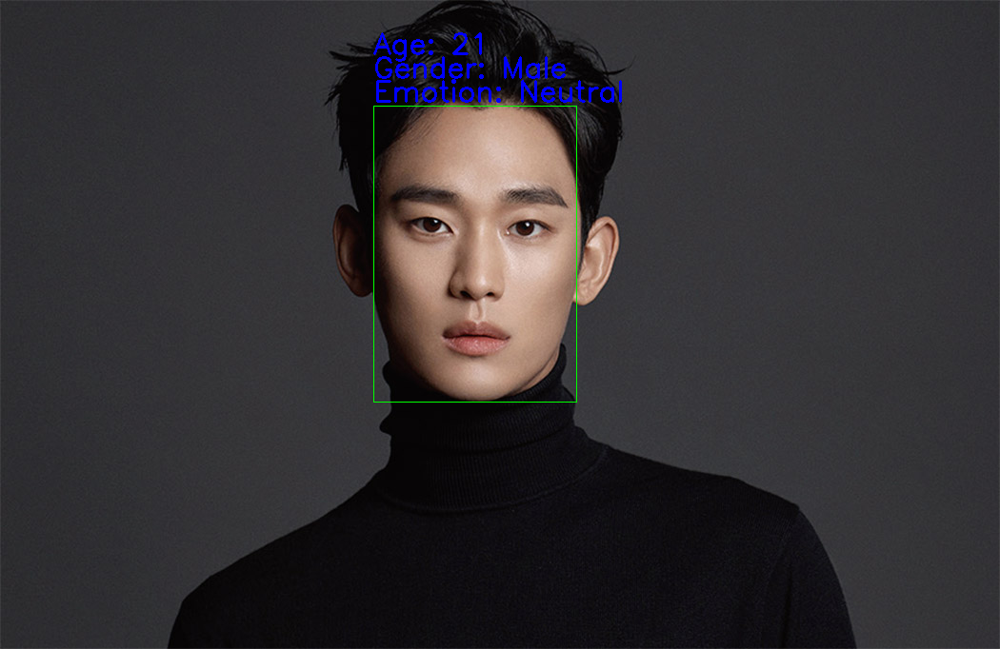

In [ ]:
image_path = '/content/김수현.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

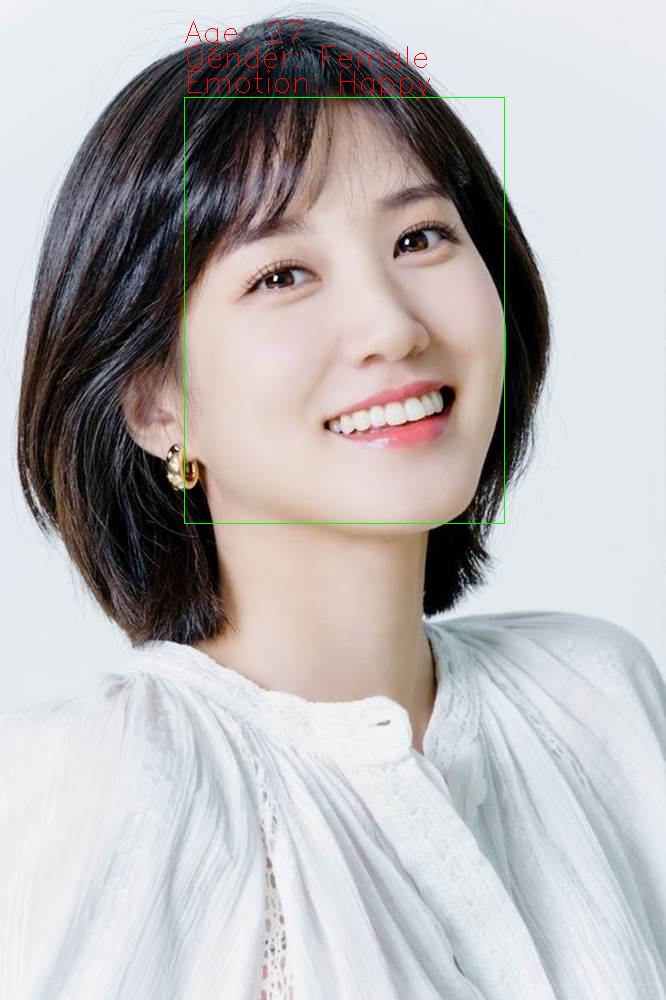

In [ ]:
image_path = '/content/박은빈.png'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

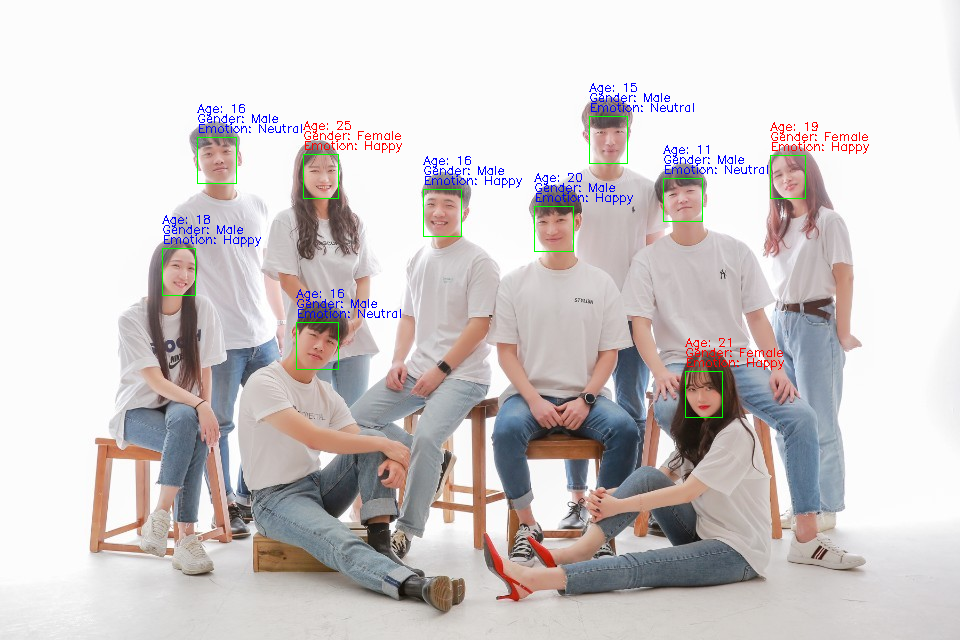

In [ ]:
image_path = '/content/대학생.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

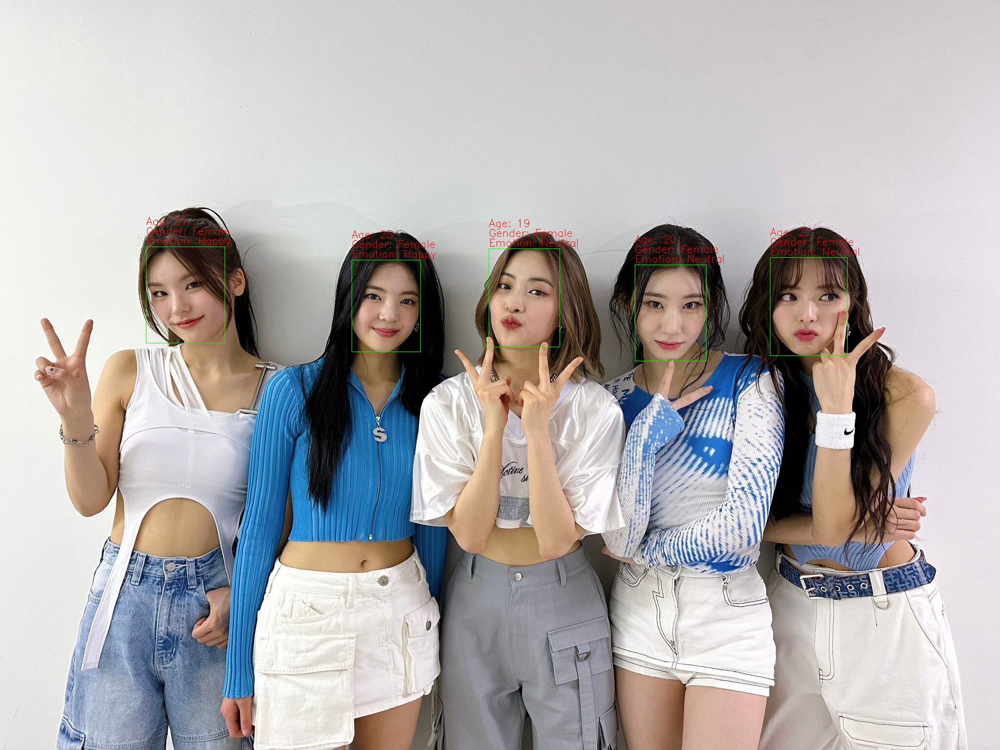

In [ ]:
image_path = '/content/itzy2.jpeg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

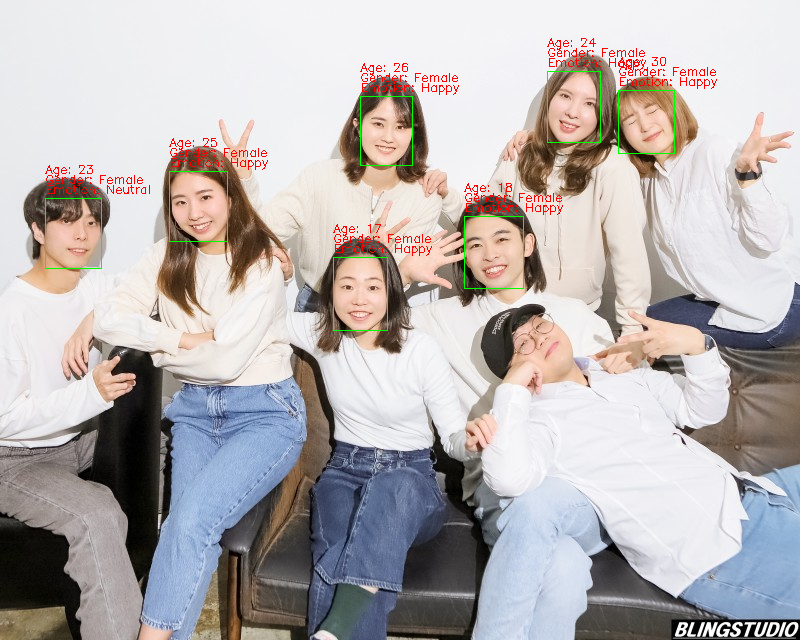

In [ ]:
image_path = '/content/단체사진.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

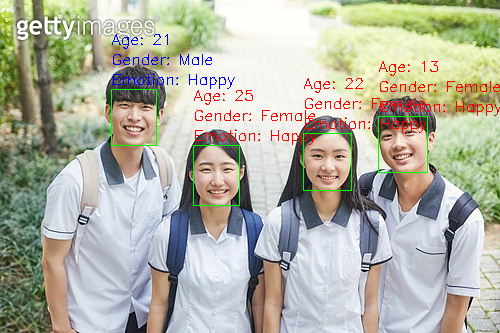

In [ ]:
image_path = '/content/student.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

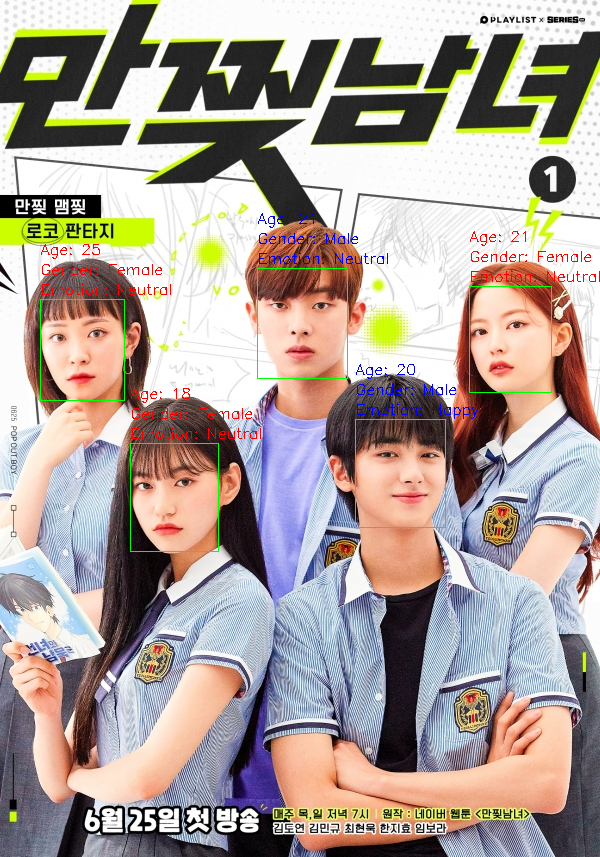

In [ ]:
image_path = '/content/drama.jpg'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

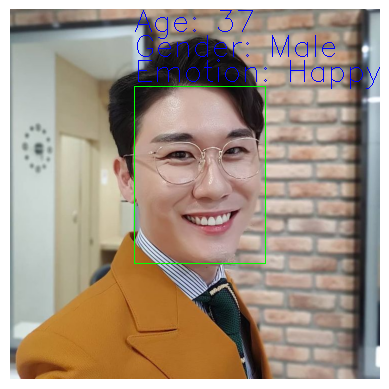

In [ ]:
image_path = '/content/disgust.png'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

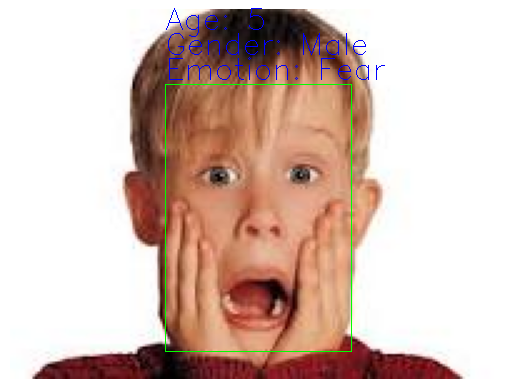

In [ ]:
image_path = '/content/surprise.png'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

[0.13003297, 0.12647359, 0.0008728306, 0.38121095, 0.34875426, 0.01265544]


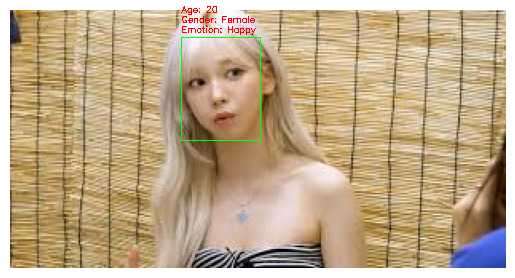

In [ ]:
image_path = '/content/angry.png'
visualize_predictions(image_path, age_model, gender_model, emotion_model)

# 동영상 시각화

In [ ]:
import time

video_input_path = '/content/video.mp4'
video_output_path = '/content/drive/MyDrive/data/video.mp4'

cap = cv2.VideoCapture(video_input_path)
codec = cv2.VideoWriter_fourcc(*'mp4v')

vid_size = (round(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),round(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
vid_fps = cap.get(cv2.CAP_PROP_FPS )

vid_writer = cv2.VideoWriter(video_output_path, codec, vid_fps, vid_size)

frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print('총 Frame 갯수:', frame_cnt, 'FPS:', round(vid_fps), 'Frame 크기:', vid_size)

총 Frame 갯수: 425 FPS: 24 Frame 크기: (406, 720)


In [ ]:
start = time.time()
index=0
while True:
    hasFrame, img_frame = cap.read()

    if not hasFrame or index >= 430:
        print('더 이상 처리할 frame이 없습니다.')
        break

    if hasFrame:
        img_frame_rgb = cv2.cvtColor(img_frame, cv2.COLOR_BGR2RGB)
        resp = RetinaFace.detect_faces(img_frame_rgb)

        pic = img_frame.copy()
        for face in resp.values():
            box = face['facial_area']
            img_tensor = process_input(img_frame_rgb, box)
            emotion_img = emotion_process_input(img_frame_rgb, box)

            age = int(predict_age(img_tensor, age_model))
            gender = predict_gender(img_tensor, gender_model)
            emotion = predict_emotion(emotion_img, emotion_model)

            if gender == 'Male':
                color = (255, 0, 0)
            else:
                color = (0, 0, 255)

            cv2.rectangle(pic, (box[0], box[1]), (box[2], box[3]), color=(0, 255, 0), thickness=1)
            cv2.putText(pic, f"Age: {age}", (box[0], box[1]-40), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
            cv2.putText(pic, f"Gender: {gender}", (box[0], box[1]-25), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
            cv2.putText(pic, f"Emotion: {emotion}", (box[0], box[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    index += 1
    if index % 10 == 0:
        print('frame :', index, '처리 완료')

    vid_writer.write(pic)

print('write 완료 시간:', round(time.time()-start,4))
vid_writer.release()
cap.release()

frame : 10 처리 완료
frame : 20 처리 완료
frame : 30 처리 완료
frame : 40 처리 완료
frame : 50 처리 완료
frame : 60 처리 완료
frame : 70 처리 완료
frame : 80 처리 완료
frame : 90 처리 완료
frame : 100 처리 완료
frame : 110 처리 완료
frame : 120 처리 완료
frame : 130 처리 완료
frame : 140 처리 완료
frame : 150 처리 완료
frame : 160 처리 완료
frame : 170 처리 완료
frame : 180 처리 완료
frame : 190 처리 완료
frame : 200 처리 완료
frame : 210 처리 완료
frame : 220 처리 완료
frame : 230 처리 완료
frame : 240 처리 완료
frame : 250 처리 완료
frame : 260 처리 완료
frame : 270 처리 완료
frame : 280 처리 완료
frame : 290 처리 완료
frame : 300 처리 완료
frame : 310 처리 완료
frame : 320 처리 완료
frame : 330 처리 완료
frame : 340 처리 완료
frame : 350 처리 완료
frame : 360 처리 완료
frame : 370 처리 완료
frame : 380 처리 완료
frame : 390 처리 완료
frame : 400 처리 완료
frame : 410 처리 완료
frame : 420 처리 완료
더 이상 처리할 frame이 없습니다.
write 완료 시간: 169.3048


In [ ]:
import time

video_input_path = '/content/video2.mp4'
video_output_path = '/content/drive/MyDrive/data/video2.mp4'

cap = cv2.VideoCapture(video_input_path)
codec = cv2.VideoWriter_fourcc(*'mp4v')

vid_size = (round(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),round(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
vid_fps = cap.get(cv2.CAP_PROP_FPS )

vid_writer = cv2.VideoWriter(video_output_path, codec, vid_fps, vid_size)

frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print('총 Frame 갯수:', frame_cnt, 'FPS:', round(vid_fps), 'Frame 크기:', vid_size)

총 Frame 갯수: 573 FPS: 30 Frame 크기: (720, 720)


In [ ]:
start = time.time()
index=0
while True:
    hasFrame, img_frame = cap.read()

    if not hasFrame or index >= 600:
        print('더 이상 처리할 frame이 없습니다.')
        break

    if hasFrame:
        img_frame_rgb = cv2.cvtColor(img_frame, cv2.COLOR_BGR2RGB)
        resp = RetinaFace.detect_faces(img_frame_rgb)

        pic = img_frame.copy()
        for face in resp.values():
            box = face['facial_area']
            img_tensor = process_input(img_frame_rgb, box)
            emotion_img = emotion_process_input(img_frame_rgb, box)

            age = int(predict_age(img_tensor, age_model))
            gender = predict_gender(img_tensor, gender_model)
            emotion = predict_emotion(emotion_img, emotion_model)

            if gender == 'Male':
                color = (255, 0, 0)
            else:
                color = (0, 0, 255)

            cv2.rectangle(pic, (box[0], box[1]), (box[2], box[3]), color=(0, 255, 0), thickness=1)
            cv2.putText(pic, f"Age: {age}", (box[0], box[1]-35), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
            cv2.putText(pic, f"Gender: {gender}", (box[0]-10, box[1]-20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
            cv2.putText(pic, f"Emotion: {emotion}", (box[0]-25, box[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    index += 1
    if index % 10 == 0:
        print('frame :', index, '처리 완료')

    vid_writer.write(pic)

print('write 완료 시간:', round(time.time()-start,4))
vid_writer.release()
cap.release()

frame : 10 처리 완료
frame : 20 처리 완료
frame : 30 처리 완료
frame : 40 처리 완료
frame : 50 처리 완료
frame : 60 처리 완료
frame : 70 처리 완료
frame : 80 처리 완료
frame : 90 처리 완료
frame : 100 처리 완료
frame : 110 처리 완료
frame : 120 처리 완료
frame : 130 처리 완료
frame : 140 처리 완료
frame : 150 처리 완료
frame : 160 처리 완료
frame : 170 처리 완료
frame : 180 처리 완료
frame : 190 처리 완료
frame : 200 처리 완료
frame : 210 처리 완료
frame : 220 처리 완료
frame : 230 처리 완료
frame : 240 처리 완료
frame : 250 처리 완료
frame : 260 처리 완료
frame : 270 처리 완료
frame : 280 처리 완료
frame : 290 처리 완료
frame : 300 처리 완료
frame : 310 처리 완료
frame : 320 처리 완료
frame : 330 처리 완료
frame : 340 처리 완료
frame : 350 처리 완료
frame : 360 처리 완료
frame : 370 처리 완료
frame : 380 처리 완료
frame : 390 처리 완료
frame : 400 처리 완료
frame : 410 처리 완료
frame : 420 처리 완료
frame : 430 처리 완료
frame : 440 처리 완료
frame : 450 처리 완료
frame : 460 처리 완료
frame : 470 처리 완료
frame : 480 처리 완료
frame : 490 처리 완료
frame : 500 처리 완료
frame : 510 처리 완료
frame : 520 처리 완료
frame : 530 처리 완료
frame : 540 처리 완료
frame : 550 처리 완료
frame : 560 처리 완료
f